## Визуализация данных с Matplotlib и Seaborn
### Подключение библиотек и скриптов

In [2]:
import numpy as np
import pandas as pd

In [88]:
import matplotlib.pyplot as plt
import seaborn as sns
import folium

In [20]:
df = pd.read_csv('bank.csv')
df['month'].replace({'may': 5, 'jun': 6, 'jul': 7, 
                     'aug': 8, 'oct': 10, 'nov': 11, 
                     'dec': 12, 'jan': 1, 'feb': 2,
                     'mar': 3, 'apr': 4, 'sep': 9}, inplace=True)
df.sample(n=10)

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,deposit
32815,36,blue-collar,single,unknown,no,185,yes,yes,cellular,17,4,301,2,-1,0,unknown,no
40077,30,management,married,tertiary,no,419,yes,no,cellular,4,6,194,1,-1,0,unknown,yes
39148,40,blue-collar,married,primary,no,-35,yes,no,cellular,18,5,194,3,-1,0,unknown,no
33308,36,entrepreneur,married,secondary,no,24,yes,no,cellular,20,4,88,1,154,2,failure,no
38472,41,services,married,secondary,no,2399,yes,no,cellular,15,5,303,2,351,2,failure,no
24940,43,technician,single,secondary,yes,685,yes,no,cellular,18,11,78,1,110,2,failure,no
18742,42,management,married,secondary,no,372,yes,no,telephone,31,7,130,8,-1,0,unknown,no
7518,44,technician,married,secondary,no,378,yes,no,unknown,30,5,203,2,-1,0,unknown,no
28367,33,services,married,secondary,no,0,yes,no,cellular,29,1,578,1,-1,0,unknown,no
31752,50,management,married,secondary,no,732,no,no,cellular,7,4,736,7,-1,0,unknown,no


In [21]:
df['month'].unique()

array([ 5,  6,  7,  8, 10, 11, 12,  1,  2,  3,  4,  9], dtype=int64)

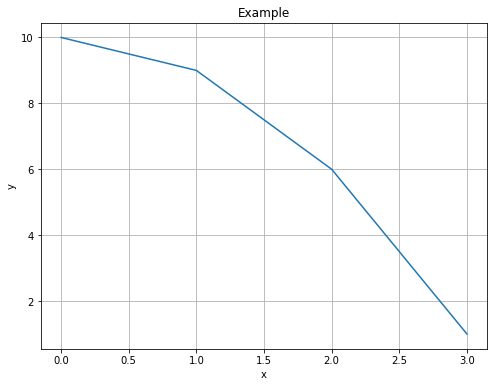

In [22]:
plt.figure(figsize=(8, 6))
plt.plot([0, 1, 2, 3], [10, 9, 6, 1])
plt.xlabel('x')
plt.ylabel('y')
plt.title('Example')
plt.grid();

## Виды графиков
### Линейный график

In [23]:
# Готовим данные для графика в виде сводной таблицы

data = df.groupby('month')['job'].agg(count='count').reset_index().sort_values(by='month')
data

,month,count
0,1,1403
1,2,2649
2,3,477
3,4,2932
4,5,13766
5,6,5341
6,7,6895
7,8,6247
8,9,579
9,10,738


### Matplotlib

Text(0, 0.5, 'Кол-во клиентов')

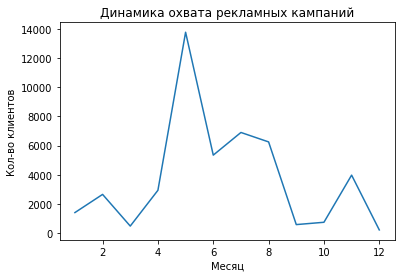

In [24]:
plt.figure(figsize=(6, 4))
plt.plot(data['month'], data['count'])
plt.title('Динамика охвата рекламных кампаний')
plt.xlabel('Месяц')
plt.ylabel('Кол-во клиентов')

### Seaborn

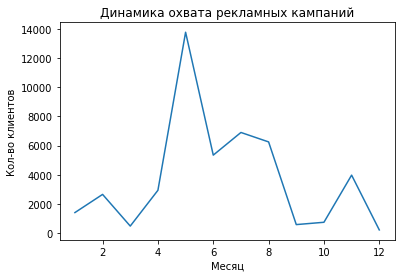

In [29]:
plt.figure(figsize=(6, 4))
sns.lineplot(x=data['month'], y=data['count'])
plt.title('Динамика охвата рекламных кампаний')
plt.xlabel('Месяц')
plt.ylabel('Кол-во клиентов');

## Гистограмма
### Matplotlib

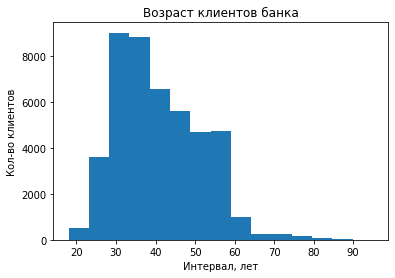

In [28]:
plt.figure(figsize=(6,4))
plt.hist(df['age'], bins=15)
plt.title('Возраст клиентов банка')
plt.xlabel('Интервал, лет')
plt.ylabel('Кол-во клиентов');

### Seaborn

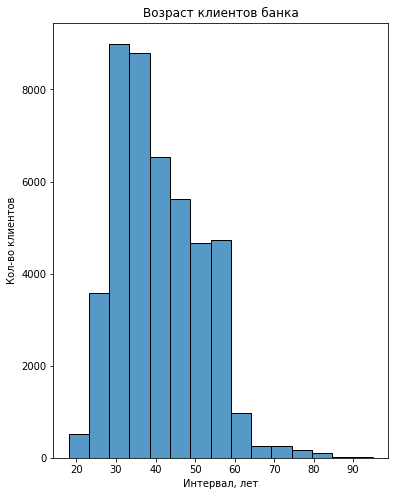

In [30]:
plt.figure(figsize=(6, 8))
sns.histplot(df['age'], bins=15)
plt.title('Возраст клиентов банка')
plt.xlabel('Интервал, лет')
plt.ylabel('Кол-во клиентов');

## Диаграмма рассеяния

In [65]:
# Готовим данные для графика в виде сводной таблицы
data = df.groupby('age')['duration'].sum().reset_index()
data.head()

,age,duration
0,18,2570
1,19,6142
2,20,10655
3,21,16484
4,22,30311


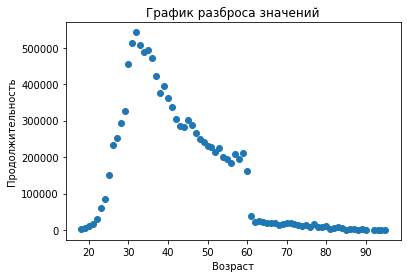

In [33]:
plt.figure(figsize=(6, 4))
plt.scatter(data['age'], data['duration'])
plt.title('График разброса значений')
plt.xlabel('Возраст')
plt.ylabel('Продолжительность');

### Seaborn

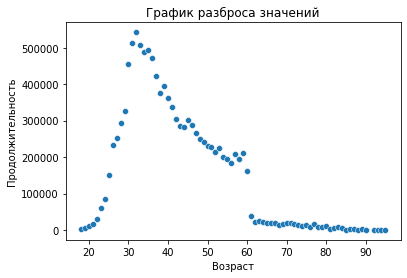

In [36]:
plt.figure(figsize=(6, 4))
sns.scatterplot(x=data['age'], y=data['duration'])
plt.title('График разброса значений')
plt.xlabel('Возраст')
plt.ylabel('Продолжительность');

## Столбчатые диаграммы

In [42]:
# Готовим данные для графика
data = df['job'].value_counts().reset_index()
data.head()

,index,job
0,blue-collar,9732
1,management,9458
2,technician,7597
3,admin.,5171
4,services,4154


### Matplotlib

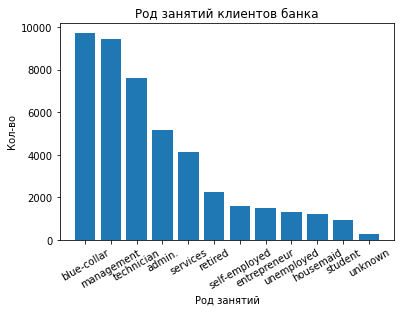

In [43]:
plt.figure(figsize=(6, 4))
plt.bar(data['index'], data['job'])
plt.title('Род занятий клиентов банка')
plt.xlabel('Род занятий')
plt.ylabel('Кол-во')
plt.xticks(rotation=30);

### Seaborn

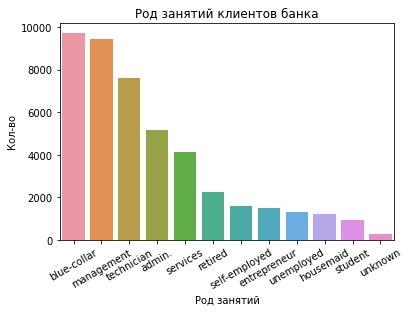

In [45]:
plt.figure(figsize=(6, 4))
sns.barplot(x=data['index'], y=data['job'])
plt.title('Род занятий клиентов банка')
plt.xlabel('Род занятий')
plt.ylabel('Кол-во')
plt.xticks(rotation=30);

## Многорядовые столбчатые диаграммы

In [47]:
# Готовим данные для графика
data = pd.crosstab(df['job'], df['duration']).reset_index().sort_values(by=0, ascending=False)
data.rename(columns={0: 'no', 1: 'yes'}, inplace=True)
data.head()

duration,job,no,yes,2,3,4,5,6,7,8,...,3102,3183,3253,3284,3322,3366,3422,3785,3881,4918
2,entrepreneur,1,0,0,1,0,0,2,1,1,...,0,0,0,0,0,0,0,0,0,0
4,management,1,0,0,0,5,9,11,14,17,...,0,0,0,0,0,0,0,0,1,0
9,technician,1,1,1,1,2,5,4,16,10,...,0,0,0,0,0,0,0,0,0,1
0,admin.,0,1,0,0,1,3,6,7,9,...,1,1,0,1,0,0,0,0,0,0
1,blue-collar,0,0,1,2,2,7,10,23,18,...,0,0,0,0,0,1,1,0,0,0


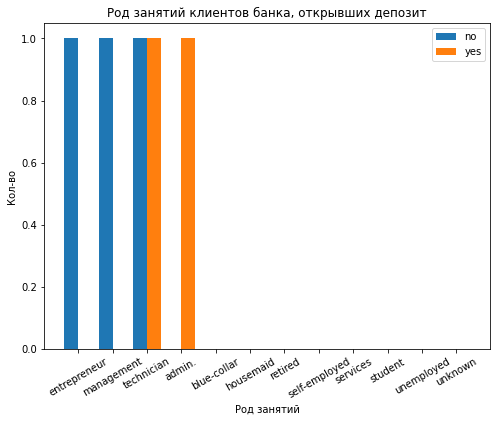

In [49]:
# Строим столбчатую многорядную диаграмму
plt.figure(figsize=(8, 6))
# определяем кол-во делений
n_ticks = np.arange(len(data['no']))
# определяем сдвиг
offset = 0.2
# определяем ширину столбцов
w = 0.4
# добавляем сдвиг к кол-ву делений
plt.bar(n_ticks - offset, data['no'], width=w)
plt.bar(n_ticks + offset, data['yes'], width=w)
plt.title('Род занятий клиентов банка, открывших депозит')
plt.xlabel('Род занятий')
plt.ylabel('Кол-во')
plt.legend(['no', 'yes'])
plt.xticks(n_ticks, data['job'], rotation = 30); # добавляем метки делений

## Сложенная столбчатая диаграмма

In [51]:
# Готовим данные для графика
data = pd.crosstab(df['job'], df['duration'], normalize='index').reset_index().sort_values(by=0, ascending=False)
data.rename(columns={0: 'no', 1: 'yes'}, inplace=True)
data.head()

duration,job,no,yes,2,3,4,5,6,7,8,...,3102,3183,3253,3284,3322,3366,3422,3785,3881,4918
2,entrepreneur,0.000672,0.000000,0.000000,0.000672,0.000000,0.000000,0.001345,0.000672,0.000672,...,0.000000,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.000000
9,technician,0.000132,0.000132,0.000132,0.000132,0.000263,0.000658,0.000527,0.002106,0.001316,...,0.000000,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.000132
4,management,0.000106,0.000000,0.000000,0.000000,0.000529,0.000952,0.001163,0.001480,0.001797,...,0.000000,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.000106,0.000000
0,admin.,0.000000,0.000193,0.000000,0.000000,0.000193,0.000580,0.001160,0.001354,0.001740,...,0.000193,0.000193,0.0,0.000193,0.0,0.000000,0.000000,0.0,0.000000,0.000000
1,blue-collar,0.000000,0.000000,0.000103,0.000206,0.000206,0.000719,0.001028,0.002363,0.001850,...,0.000000,0.000000,0.0,0.000000,0.0,0.000103,0.000103,0.0,0.000000,0.000000


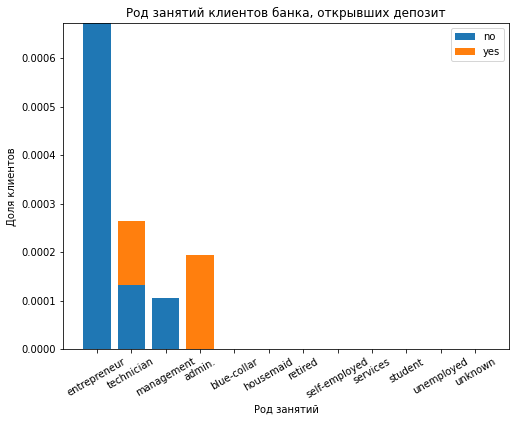

In [52]:
# Строим столбчатую многорядную сложенную диаграмму
plt.figure(figsize=(8, 6))
plt.bar(data['job'], data['no'])
plt.bar(data['job'], data['yes'], bottom=data['no'])
plt.title('Род занятий клиентов банка, открывших депозит')
plt.xlabel('Род занятий')
plt.ylabel('Доля клиентов')
plt.legend(['no', 'yes'])
plt.xticks(rotation = 30);

## Ящики с усами

In [55]:
# Готовим данные для графика
data1 = df['duration'][df['campaign'] == 1]
data2 = df['duration'][df['campaign'] == 0]
data1.head()

0    261
1    151
2     76
3     92
4    198
Name: duration, dtype: int64

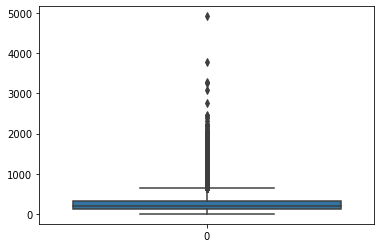

In [56]:
plt.figure(figsize=(6, 4))
sns.boxplot(data=[data1]);

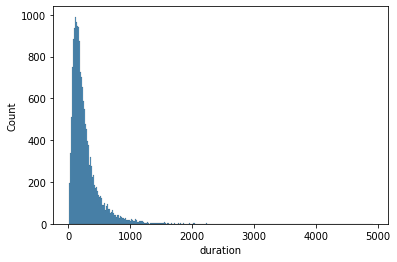

In [57]:
sns.histplot(x=data1);

### Matplotlib

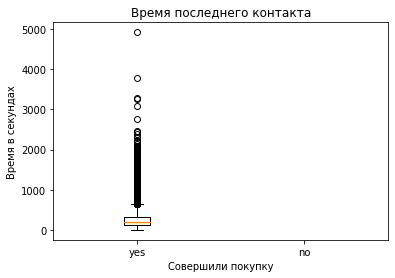

In [58]:
# Строим боксплот
plt.figure(figsize=(6, 4))
plt.boxplot([data1, data2])
plt.title('Время последнего контакта')
plt.xlabel('Совершили покупку')
plt.ylabel('Время в секундах')
plt.xticks([1, 2], ['yes', 'no']);

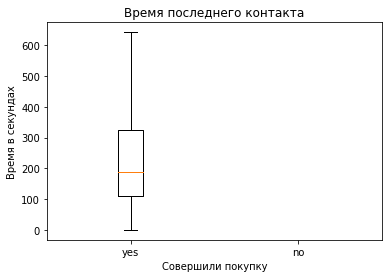

In [59]:
# Строим боксплот без выбросов 
plt.figure(figsize=(6, 4))
plt.boxplot([data1, data2], showfliers=False)
plt.title('Время последнего контакта')
plt.xlabel('Совершили покупку')
plt.ylabel('Время в секундах')
plt.xticks([1, 2], ['yes', 'no']);

### Seaborn

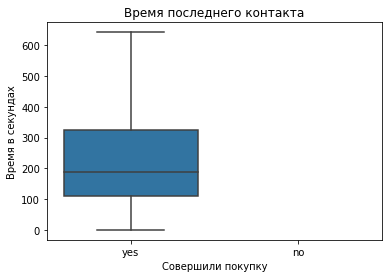

In [60]:
# Строим боксплот без выбросов 
plt.figure(figsize=(6, 4))
sns.boxplot(data=[data1, data2], showfliers=False)
plt.title('Время последнего контакта')
plt.xlabel('Совершили покупку')
plt.ylabel('Время в секундах')
plt.xticks([0, 1], ['yes', 'no']);

## Круговая диаграмма

In [62]:
# Готовим данные для графика
data = df['deposit'].value_counts()
data.index = ['no', 'yes']
data.head()

no     39922
yes     5289
Name: deposit, dtype: int64

### Matplotlib

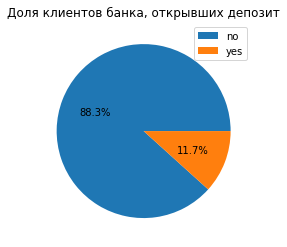

In [63]:
# Строим круговую диаграмму
plt.figure(figsize=(6, 4))
plt.pie(data, autopct='%1.1f%%')
plt.title('Доля клиентов банка, открывших депозит')
plt.legend(data.index);

## Визуальный анализ данных
### Описание датасета 
Статистические данные о ряде домов в Калифорнии, основанные на переписи 1990 года.

longitude - долгота

latitude - широта

housing_median_age - средний возраст дома

total_rooms - общее количество комнат

total_bedrooms - общее количество спален

population - количество проживающих

households - домохозяйства

ocean_proximity - близость океана

median_income - средний доход

median_house_value - средняя стоимость дома

In [67]:
df = pd.read_csv('housing.csv')
df.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY


## Распределение вещественных признаков

In [68]:
# {'red', 'green', 'blue'} - дискретный признак ('red', 'green', 'blue', 'red', 'green', 'red')
# [0, 100] - вещественный признак (0, 5, 5.6, 10.5, 10.57)

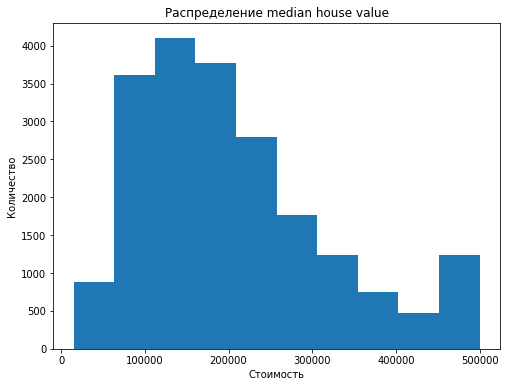

In [69]:
plt.figure(figsize=(8, 6))
plt.hist(df['median_house_value'])
plt.title('Распределение median house value')
plt.xlabel('Стоимость')
plt.ylabel('Количество');

In [72]:
df_num_features = df.select_dtypes(include=['float64'])
df_num_features.drop('median_house_value', axis=1, inplace=True)

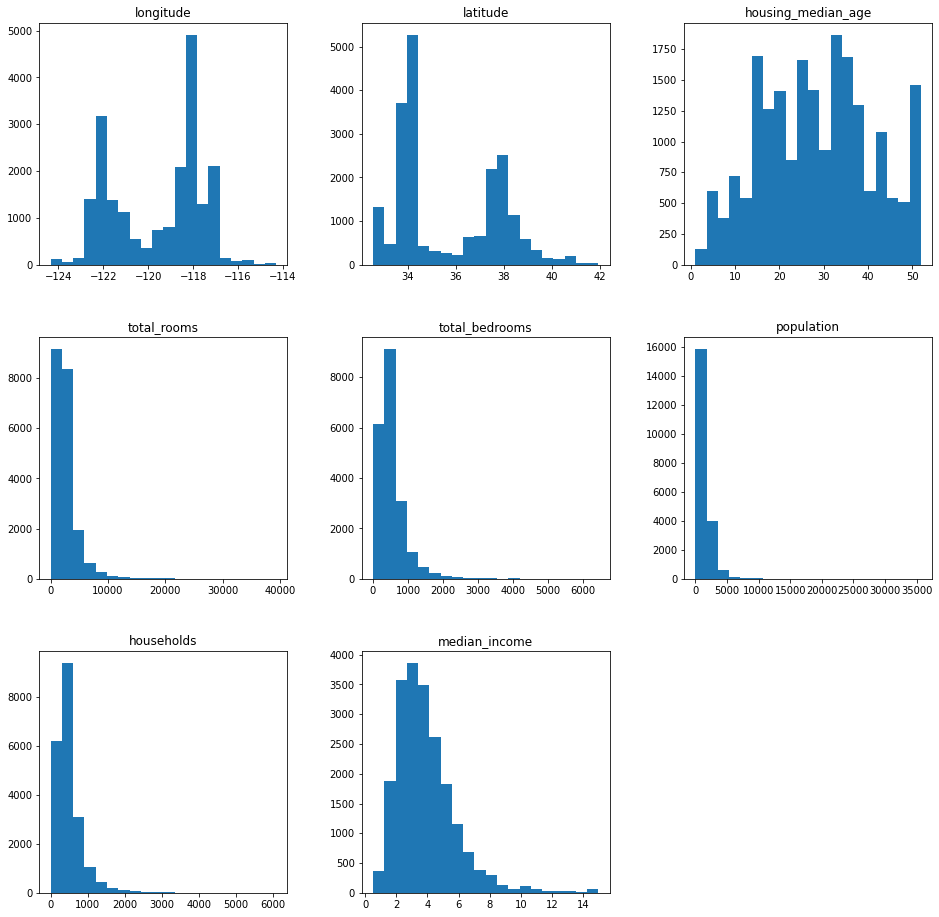

In [73]:
df_num_features.hist(figsize=(16, 16), bins=20, grid=False);

### Поиск выбросов с помощью box plot
### Как строится box plot

Подробное объяснение
- box - от 25% до 75% квантиля
- линия в середине box - медиана
- "усы"
### Как строятся "усы" - вариантов масса
- среднее +/- 3 сигма (стандартное отклонение)
- min / max
- median +/- 1.5*(q75 - q25),
- ...

###### *Интерквартильный размах = q75 - q25

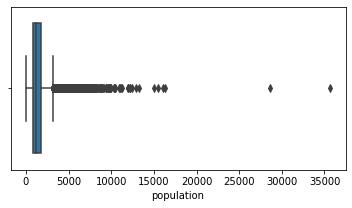

In [74]:
plt.figure(figsize=(6, 3))
sns.boxplot(x=df['population'], whis=1.5)
plt.xlabel('population')
plt.show()

### Анализ категориальных признаков

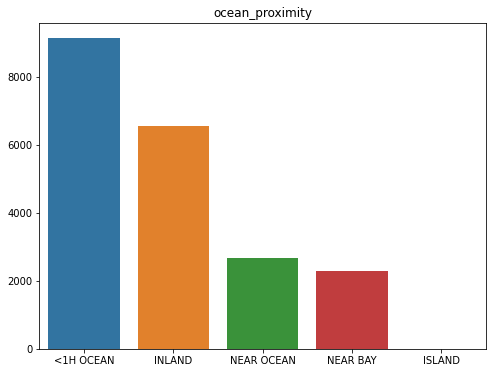

In [75]:
counts = df['ocean_proximity'].value_counts()
 
plt.figure(figsize=(8, 6)) 
plt.title('ocean_proximity')
sns.barplot(x=counts.index, y=counts.values)
 
plt.show()

In [76]:
counts = df['INLAND'].value_counts()
 
plt.figure(figsize=(8, 6)) 
plt.title('INLAND')
sns.barplot(x=counts.index, y=counts.values)
 
plt.show()

KeyError: 'INLAND'

### Анализ взаимных распределений

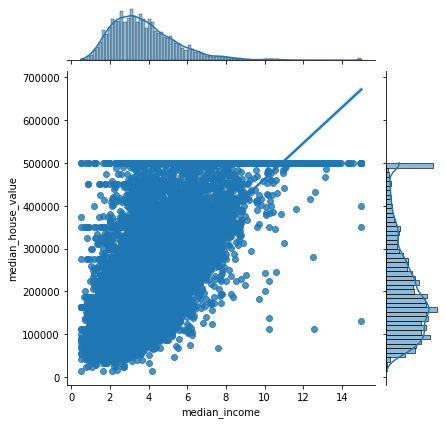

In [77]:
sns.jointplot(x=df['median_income'], y=df['median_house_value'], kind='reg');

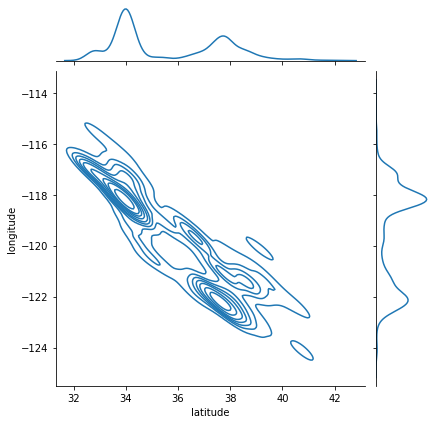

In [81]:
sns.jointplot(x=df['latitude'], y=df['longitude'], kind='kde');

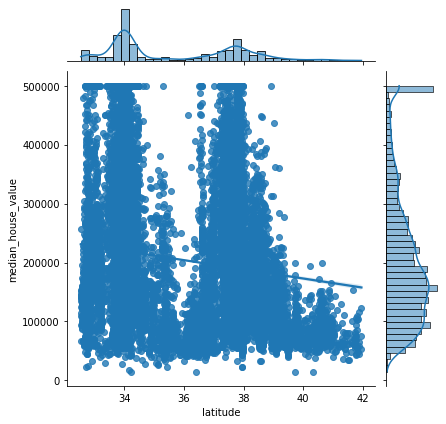

In [79]:
sns.jointplot(x=df['latitude'], y=df['median_house_value'], kind='reg');

### Видно два города, имеет смысл посмотреть на зависимость по отдельности

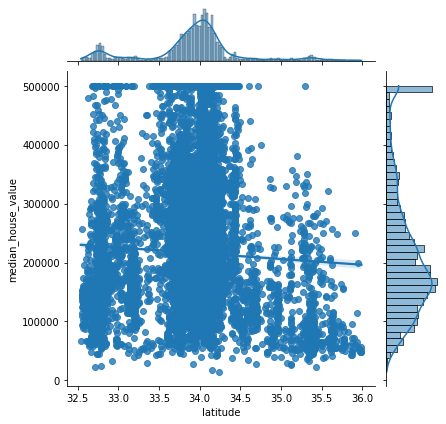

In [82]:
df_cut = df[df['latitude'] < 36]
sns.jointplot(x=df_cut['latitude'], y=df_cut['median_house_value'], kind='reg');

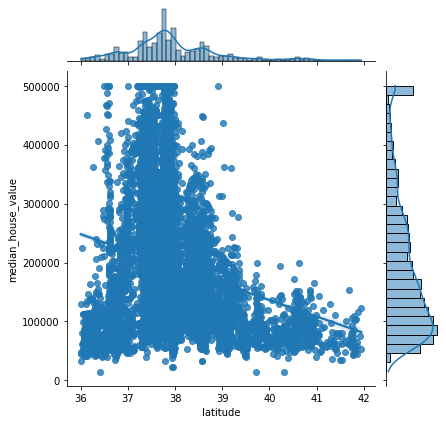

In [83]:
df_cut = df[df['latitude'] >= 36]
sns.jointplot(x=df_cut['latitude'], y=df_cut['median_house_value'], kind='reg');

### longitude

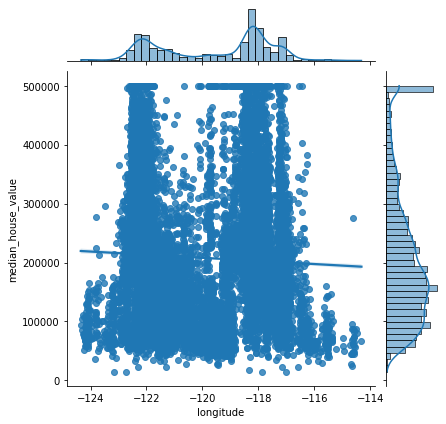

In [84]:
sns.jointplot(x=df['longitude'], y=df['median_house_value'], kind='reg');

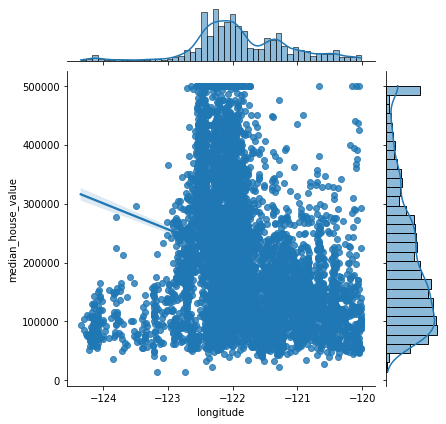

In [85]:
df_cut = df[df['longitude'] < -120]
sns.jointplot(x=df_cut['longitude'], y=df_cut['median_house_value'], kind='reg');

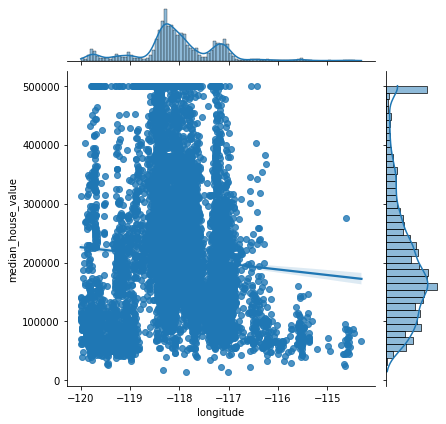

In [86]:
df_cut = df[df['longitude'] >= -120]
sns.jointplot(x=df_cut['longitude'], y=df_cut['median_house_value'], kind='reg');

### Категориальные / бинарные признаки
### box plot

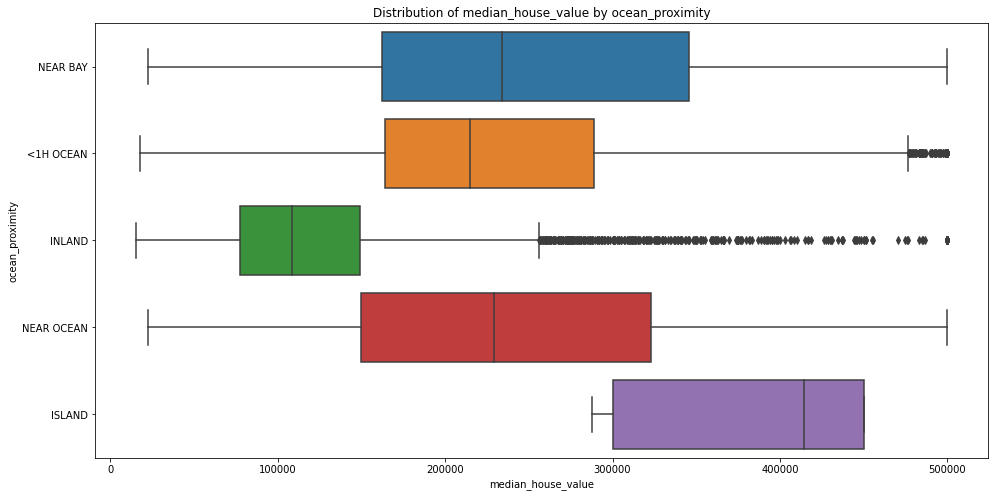

In [87]:
plt.figure(figsize=(16, 8))
sns.boxplot(x=df['median_house_value'], y=df['ocean_proximity'], whis=1.5)
plt.xlabel('median_house_value')
plt.ylabel('ocean_proximity')
plt.title('Distribution of median_house_value by ocean_proximity');

### Матрица корреляций
- Показывает линейную связь между переменными
- Изменяется от -1 до 1
- Корреляция - мера только линейной связи

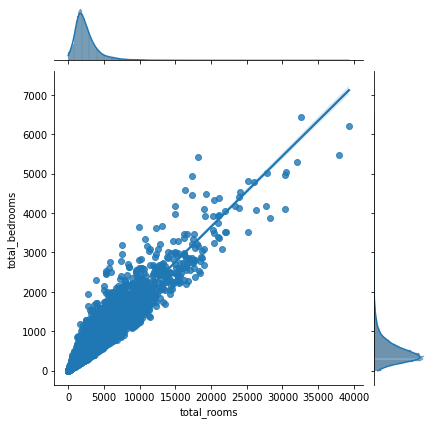

In [88]:
sns.jointplot(x=df['total_rooms'], y=df['total_bedrooms'], kind='reg');

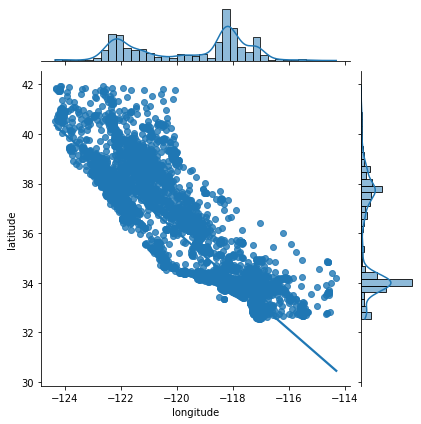

In [89]:
sns.jointplot(x=df['longitude'], y=df['latitude'], kind='reg');

In [90]:
corr_matrix = df.corr()
corr_matrix = np.round(corr_matrix, 1)
corr_matrix[np.abs(corr_matrix) < 0.3] = 0
corr_matrix

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
longitude,1.0,-0.9,0.0,0.0,0.0,0.0,0.0,0.0,0.0
latitude,-0.9,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
housing_median_age,0.0,0.0,1.0,-0.4,-0.3,-0.3,-0.3,0.0,0.0
total_rooms,0.0,0.0,-0.4,1.0,0.9,0.9,0.9,0.0,0.0
total_bedrooms,0.0,0.0,-0.3,0.9,1.0,0.9,1.0,0.0,0.0
population,0.0,0.0,-0.3,0.9,0.9,1.0,0.9,0.0,0.0
households,0.0,0.0,-0.3,0.9,1.0,0.9,1.0,0.0,0.0
median_income,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.7
median_house_value,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.7,1.0


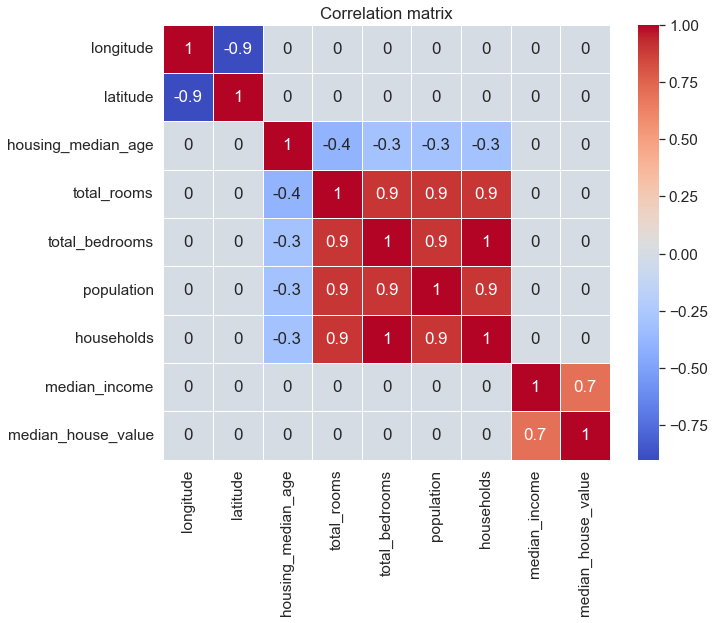

In [91]:
plt.figure(figsize=(10, 8))
sns.set(font_scale=1.4)
sns.heatmap(corr_matrix, annot=True, linewidths=.5, cmap='coolwarm')
plt.title('Correlation matrix');

## Гео данные

In [92]:
min_long = -124.55
max_long = -113.80
min_lat = 32.45
max_lat = 42.05

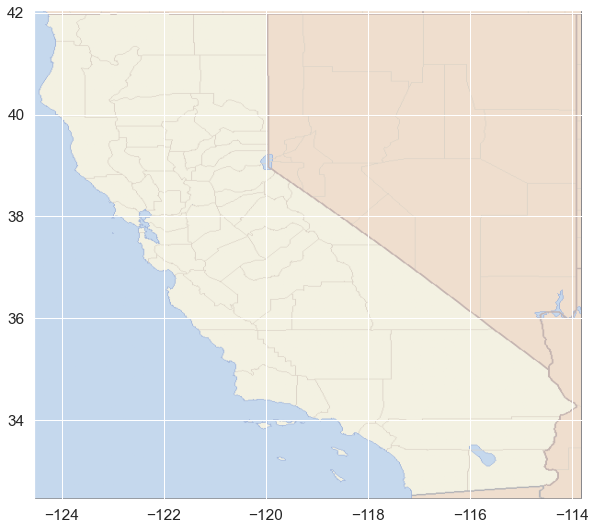

In [95]:
import matplotlib.image as img
california_map = img.imread('California_Map.png')
plt.figure(figsize=(12, 9))
plt.imshow(california_map,
 extent=[min_long, max_long, min_lat, max_lat], alpha=0.5);

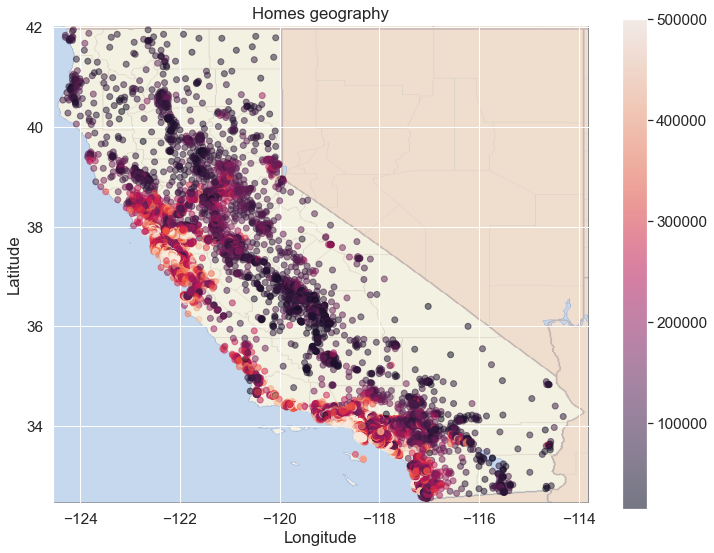

In [98]:
plt.figure(figsize=(12, 9))
sc = plt.scatter(df['longitude'], df['latitude'], alpha=0.5, c=df['median_house_value'])
plt.imshow(california_map,
 extent=[min_long, max_long, min_lat, max_lat], alpha=0.5)
plt.colorbar(sc)
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.title("Homes geography");

## Folium

In [87]:
import folium
this_map = folium.Map(prefer_canvas=True)
def plotDot(point):
 folium.CircleMarker(
 location=[point.latitude, point.longitude],
 radius=1,
 popup=point.median_house_value
 ).add_to(this_map)
 
df.apply(plotDot, axis=1)
this_map.fit_bounds(this_map.get_bounds())
this_map

AttributeError: 'Series' object has no attribute 'latitude'

## Kepler**

In [102]:
from keplergl import KeplerGl
map_ = KeplerGl(height=700)
map_.add_data(df, 'Data')
map_.save_to_html(file_name='./california.html')

User Guide: https://github.com/keplergl/kepler.gl/blob/master/docs/keplergl-jupyter/user-guide.md
Map saved to ./california.html!


## 1 задача

Скачать данные по ссылке https://drive.google.com/file/d/1MpAdHAl727fO3oW32NO4FpSRhUBUfjfS

Считать данные с помощью pandas

Вывести на экран первые 5 строк

In [89]:
df = pd.read_csv('laptops_10.csv')
df

,Company,Product,TypeName,Inches,Cpu,Ram,Gpu,OpSys,Weight,Price_euros,Cpu_Company,Memory_Amount,Memory_Type
0,Apple,MacBook Pro,Ultrabook,13.3,Intel Core i5 2.3GHz,8GB,Intel Iris Plus Graphics 640,macOS,1.37,1339.69,Intel,128,SSD
1,Apple,Macbook Air,Ultrabook,13.3,Intel Core i5 1.8GHz,8GB,Intel HD Graphics 6000,macOS,1.34,898.94,Intel,128,FlashStorage
2,HP,250 G6,Notebook,15.6,Intel Core i5 7200U 2.5GHz,8GB,Intel HD Graphics 620,No OS,1.86,575.00,Intel,256,SSD
3,Apple,MacBook Pro,Ultrabook,15.4,Intel Core i7 2.7GHz,16GB,AMD Radeon Pro 455,macOS,1.83,2537.45,Intel,512,SSD
4,Apple,MacBook Pro,Ultrabook,13.3,Intel Core i5 3.1GHz,8GB,Intel Iris Plus Graphics 650,macOS,1.37,1803.60,Intel,256,SSD
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1298,Lenovo,Yoga 500-14ISK,2 in 1 Convertible,14.0,Intel Core i7 6500U 2.5GHz,4GB,Intel HD Graphics 520,Windows 10,1.80,638.00,Intel,128,SSD
1299,Lenovo,Yoga 900-13ISK,2 in 1 Convertible,13.3,Intel Core i7 6500U 2.5GHz,16GB,Intel HD Graphics 520,Windows 10,1.30,1499.00,Intel,512,SSD
1300,Lenovo,IdeaPad 100S-14IBR,Notebook,14.0,Intel Celeron Dual Core N3050 1.6GHz,2GB,Intel HD Graphics,Windows 10,1.50,229.00,Intel,64,FlashStorage
1301,HP,15-AC110nv (i7-6500U/6GB/1TB/Radeon,Notebook,15.6,Intel Core i7 6500U 2.5GHz,6GB,AMD Radeon R5 M330,Windows 10,2.19,764.00,Intel,1024,HDD


### 1.1 Изучите количество памяти с  помощью matplotlib

- Постройте график
- Назовите график
- Сделайте именование оси x и оси y
- Сделайте выводы

Text(0, 0.5, 'Number')

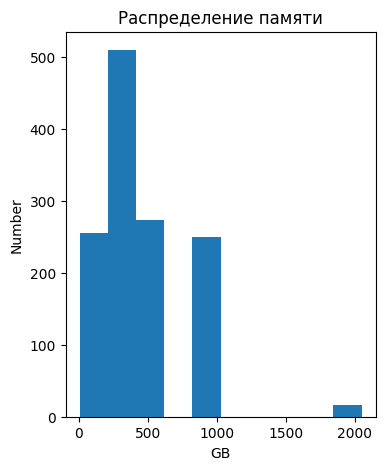

In [11]:
plt.figure(figsize=(4, 5))
plt.hist(df['Memory_Amount'])
plt.title('Распределение памяти')
plt.xlabel('GB')
plt.ylabel('Number')

In [18]:
df['Memory_Amount'].value_counts()

256     508
1024    250
128     177
512     140
500     132
32       45
64       17
2048     16
16       10
180       5
240       1
8         1
508       1
Name: Memory_Amount, dtype: int64

### 1.2 Изучите стоимость ноутбуков с помощью matplotlib

- Постройте график
- Назовите график
- Сделайте именование оси x и оси y
- Сделайте выводы

Text(0, 0.5, 'Количество')

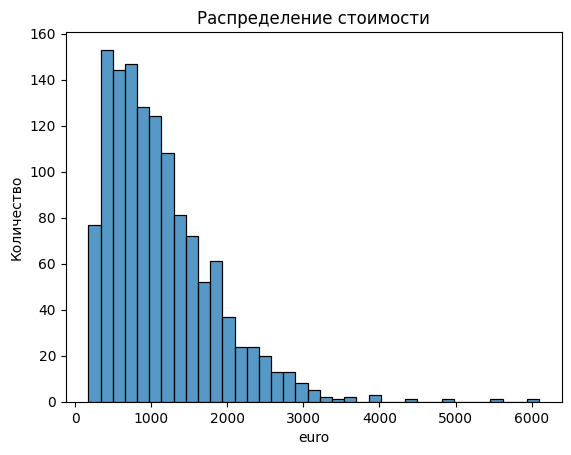

In [23]:
sns.histplot(df['Price_euros'])
plt.title('Распределение стоимости')
plt.xlabel('euro')
plt.ylabel('Количество')

In [22]:
df['Price_euros'].value_counts()

1499.0    14
1099.0    14
1799.0    14
899.0     11
1199.0    11
          ..
2090.0     1
304.0      1
759.0      1
1858.0     1
2699.0     1
Name: Price_euros, Length: 791, dtype: int64

### 1.3 Изучите вес ноутбуков с помощью matplotlib

- Постройте график
- Назовите график
- Сделайте именование оси x и оси y
- Сделайте выводы

Text(0, 0.5, 'Количество')

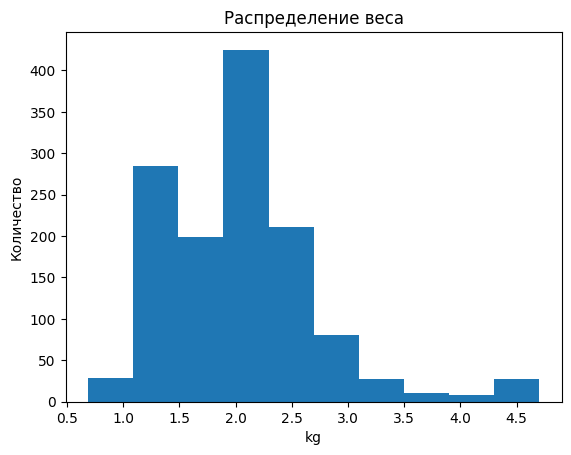

In [25]:
plt.hist(df['Weight'])
plt.title('Распределение веса')
plt.xlabel('kg')
plt.ylabel('Количество')

Text(0, 0.5, 'Количество')

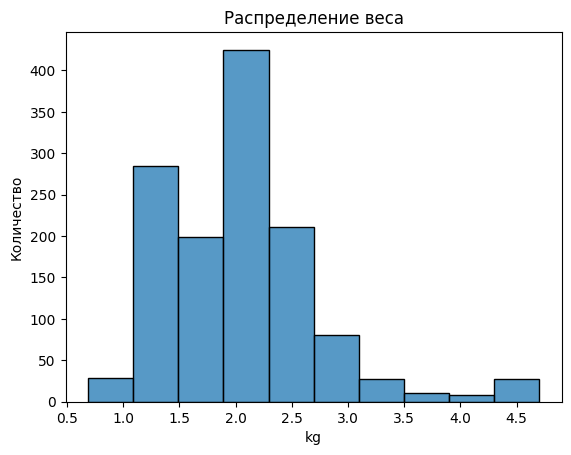

In [27]:
sns.histplot(df['Weight'], bins=10)
plt.title('Распределение веса')
plt.xlabel('kg')
plt.ylabel('Количество')

## 2 Задача
### 2.1 Изучите распределение типов носителя

- Постройте график
- Сделайте выводы

In [30]:
data = df['Memory_Type'].value_counts()
data.index

Index(['SSD', 'HDD', 'FlashStorage', 'Hybrid'], dtype='object')

In [34]:
data.values

array([641, 576,  74,  12], dtype=int64)

Text(0.5, 1.0, 'Распределение типов носителя')

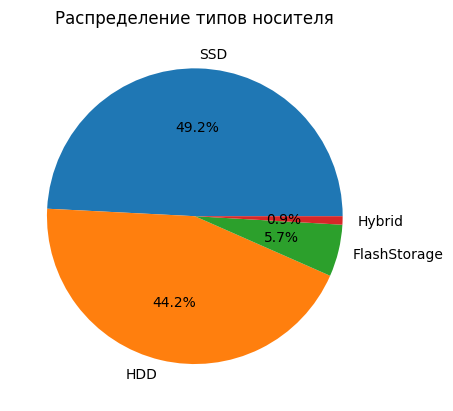

In [37]:
plt.pie(data, autopct='%1.1f%%', labels=data.index)
plt.title('Распределение типов носителя')
# plt.legend(data.index);

### 2.2 Изучите распределение компаний производителей

- Постройте график
- Сделайте выводы

In [41]:
data = df['Company'].value_counts()

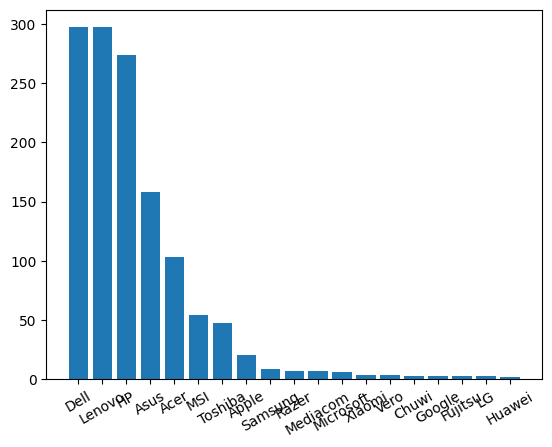

In [45]:
plt.bar(data.index, data.values)
plt.xticks(rotation=30);

# # Готовим данные для графика
# data = df['job'].value_counts().reset_index()
# data.head()
# plt.figure(figsize=(6, 4))
# plt.bar(data['index'], data['job'])
# plt.title('Род занятий клиентов банка')
# plt.xlabel('Род занятий')
# plt.ylabel('Кол-во')
# plt.xticks(rotation=30);

### 2.3 Изучите распределение операционной системы

- Постройте график
- Сделайте выводы

In [46]:
data = df['OpSys'].value_counts()

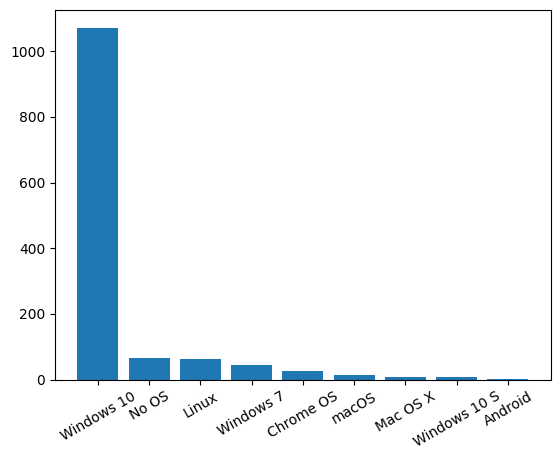

In [49]:
plt.bar(data.index, data.values)
plt.xticks(rotation=30);

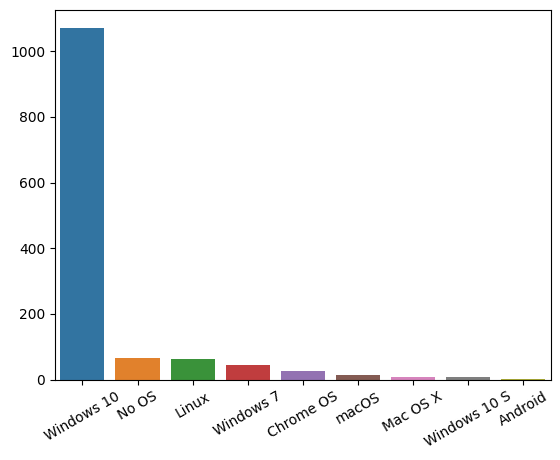

In [52]:
sns.barplot(x=data.index, y=data.values)
plt.xticks(rotation=30);

### 2.4 Изучите распределение компаний производителей CPU
- Постройте график
- Сделайте выводы

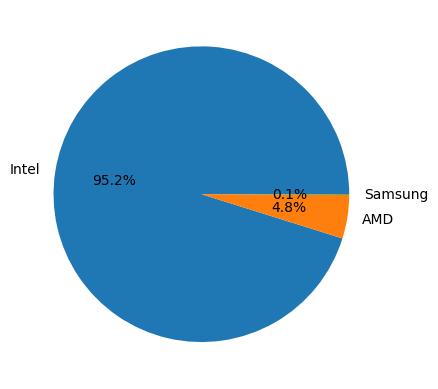

In [54]:
data = df['Cpu_Company'].value_counts()
plt.pie(data.values, autopct='%.1f%%', labels=data.index);

## 3 задача
Изучите взаимосвязь компаний производителей ноутбуков и компаний производителей процессоров, используя сложенную или многорядовую столбчатую диаграмму


Процессоры от Samsung не изучайте

In [62]:
data = pd.crosstab(index=df['Company'], columns=df['Cpu_Company'])
data = data.drop(columns=['Samsung']).reset_index()
data

Cpu_Company,Company,AMD,Intel
0,Acer,10,93
1,Apple,0,21
2,Asus,11,147
3,Chuwi,0,3
4,Dell,0,297
5,Fujitsu,0,3
6,Google,0,3
7,HP,25,249
8,Huawei,0,2
9,LG,0,3


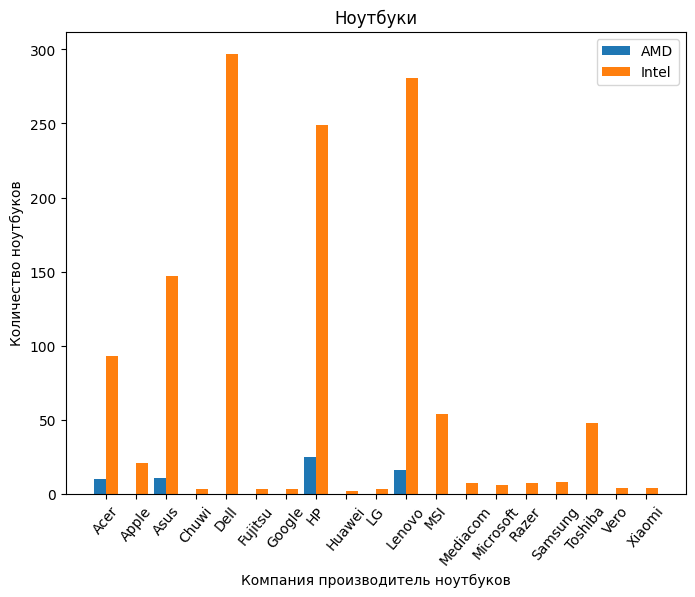

In [67]:
# Строим столбчатую многорядную диаграмму
plt.figure(figsize=(8, 6))
# определяем кол-во делений
n_ticks = np.arange(len(data['AMD']))
# определяем сдвиг
offset = 0.2
# определяем ширину столбцов
w = 0.4
# добавляем сдвиг к кол-ву делений
plt.bar(n_ticks - offset, data['AMD'], width=w)
plt.bar(n_ticks + offset, data['Intel'], width=w)
plt.title('Ноутбуки')
plt.xlabel('Компания производитель ноутбуков')
plt.ylabel('Количество ноутбуков')
plt.legend(['AMD', 'Intel'])
plt.xticks(n_ticks, data['Company'], rotation=50); 

### 3.2 Постройте график в относительных величинах

In [68]:
data = pd.crosstab(index=df['Company'], columns=df['Cpu_Company'], normalize='index')
data = data.drop(columns=['Samsung']).reset_index()
data

Cpu_Company,Company,AMD,Intel
0,Acer,0.097087,0.902913
1,Apple,0.000000,1.000000
2,Asus,0.069620,0.930380
3,Chuwi,0.000000,1.000000
4,Dell,0.000000,1.000000
5,Fujitsu,0.000000,1.000000
6,Google,0.000000,1.000000
7,HP,0.091241,0.908759
8,Huawei,0.000000,1.000000
9,LG,0.000000,1.000000


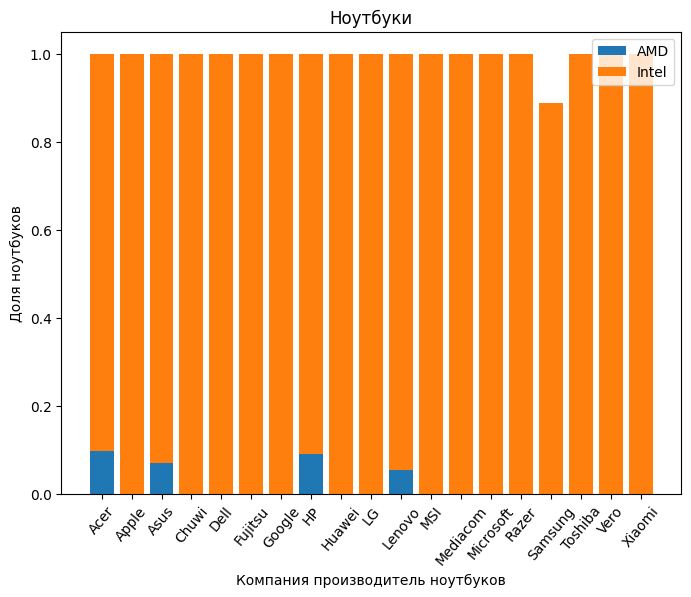

In [69]:
# Строим столбчатую многорядную сложенную диаграмму
plt.figure(figsize=(8, 6))
plt.bar(data['Company'], data['AMD'])
plt.bar(data['Company'], data['Intel'], bottom=data['AMD'])
plt.title('Ноутбуки')
plt.xlabel('Компания производитель ноутбуков')
plt.ylabel('Доля ноутбуков')
plt.legend(['AMD', 'Intel'])
plt.xticks(rotation=50);

## 4 задача
### 4.1 Изучите взаимосвязь стоимости ноутбука и компании производителя процессора

- Постройте график
- Назовите график
- Сделайте именование оси x и оси y
- Сделайте выводы

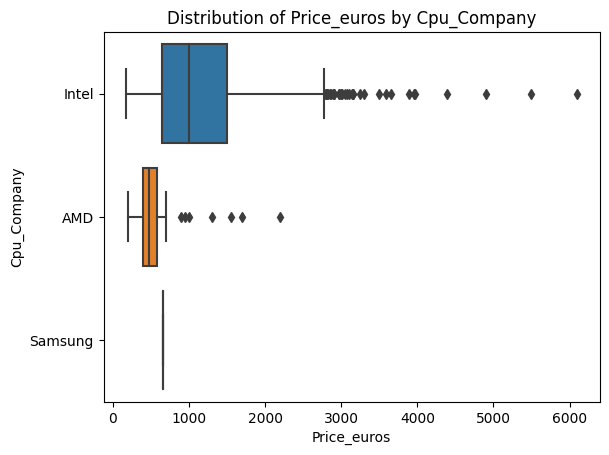

In [75]:
sns.boxplot(x=df['Price_euros'], y=df['Cpu_Company'], whis=1.5);
plt.xlabel('Price_euros')
plt.ylabel('Cpu_Company')
plt.title('Distribution of Price_euros by Cpu_Company');

### 4.2 Изучите взаимосвязь стоимости ноутбука и типа носителя памяти

- Постройте график
- Назовите график
- Сделайте именование оси x и оси y
- Сделайте выводы

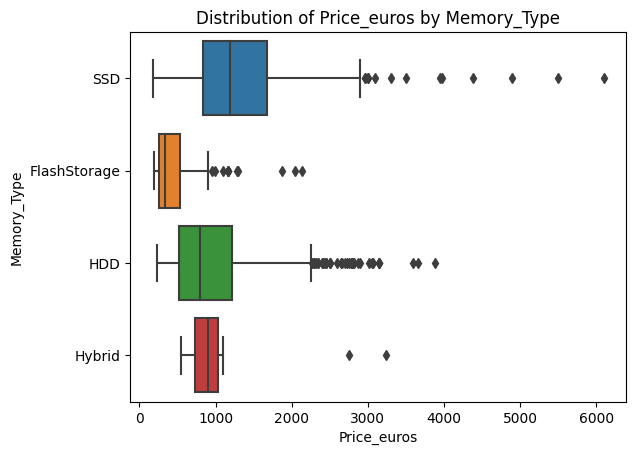

In [76]:
sns.boxplot(x=df['Price_euros'], y=df['Memory_Type'], whis=1.5)
plt.xlabel('Price_euros')
plt.ylabel('Memory_Type')
plt.title('Distribution of Price_euros by Memory_Type');

### 4.3 Изучите взаимосвязь стоимости ноутбука и кол-ва оперативной памяти

- Постройте график
- Назовите график
- Сделайте именование оси x и оси y
- Сделайте выводы

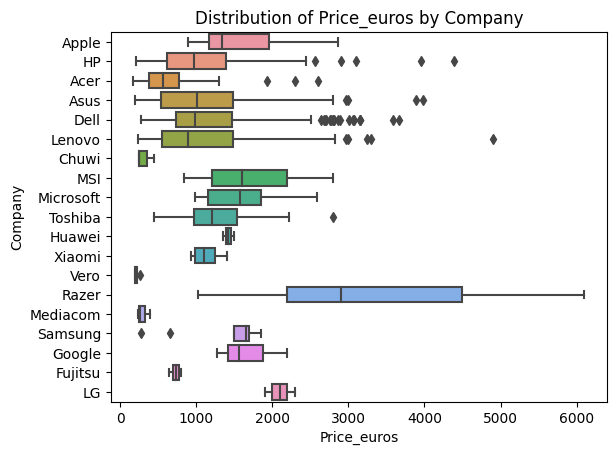

In [77]:
sns.boxplot(x=df['Price_euros'], y=df['Company'], whis=1.5)
plt.xlabel('Price_euros')
plt.ylabel('Company')
plt.title('Distribution of Price_euros by Company');

## 5 задача*

Постройте матрицу корреляций для таблицы

In [83]:
corr_matrix = df.corr()
corr_matrix = np.round(corr_matrix, 1)
corr_matrix[np.abs(corr_matrix) < 0.3] = 0
corr_matrix

C:\Users\tatia\AppData\Local\Temp\ipykernel_6692\4194942596.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = df.corr()


,Inches,Weight,Price_euros,Memory_Amount
Inches,1.0,0.8,0.0,0.3
Weight,0.8,1.0,0.0,0.0
Price_euros,0.0,0.0,1.0,0.0
Memory_Amount,0.3,0.0,0.0,1.0


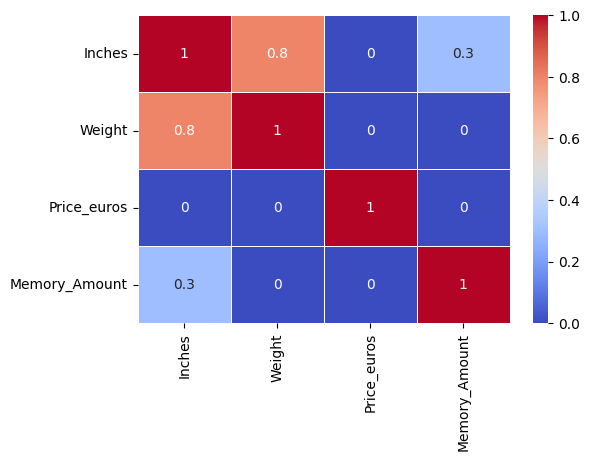

In [84]:
plt.figure(figsize=(6, 4))
sns.heatmap(corr_matrix, annot=True, linewidths=.5, cmap='coolwarm');

In [92]:
df = pd.read_csv('kc_house_data.csv')

In [93]:
this_map = folium.Map(prefer_canvas=True)

def plotDot(point):
    folium.CircleMarker(location=[point.lat, point.long], radius=2).add_to(this_map)
        # popup=point.median_house_value
#         ).add_to(this_map)

df.apply(plotDot, axis=1)

this_map.fit_bounds(this_map.get_bounds())

this_map